## Disagreement_global_vs_shap

In [18]:
# Import libraries
# !pip install treeshap
# os.chdir("../")
import os
import pandas as pd
import pickle
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import random
# import treeshap
from treeshap import treeshap_tabular
import shap

import json
from typing import Union
from datetime import datetime as dt
import numpy as np
from compactor.ActivatedCompactor import ActivatedCompactor
from compactor.MaxCompactor import MaxCompactor
from compactor.MaxNonActivatedCompactor import MaxNonActivatedCompactor

ModuleNotFoundError: No module named 'treeshap'

In [ ]:
PROCESSED_DATA = "/storage/scratch/e17-fyp-xai/projects/e17-4yp-using-machine-learning-in-high-stake-settings/code/processed_data/processed_final_data_latest.csv"

In [ ]:
raw_data = pd.read_csv(PROCESSED_DATA)

In [ ]:
raw_data.head()

In [ ]:
raw_data[raw_data["Project ID"] == "cdc83b2eb031d999c123535bf09d24a0" ]

In [ ]:
!ls

In [ ]:
os.chdir("/storage/scratch/e17-fyp-xai/projects/thanujan/e17-4yp-using-machine-learning-in-high-stake-settings/code")
import os
import feature_engineer as fe 
import data_processor as dp
import config
from helper import (
    save_model,
    load_model,
    create_dirs,
    create_classification_models,
    create_logistic_regression_parameters,
    create_random_forest_parameters,
    create_xgb_classifier_parameters,
    log_intermediate_output_to_file,
    filter_dataset_by_date)
import temporal_features as tmpf
import config

In [ ]:
data = dp.set_data_types_to_datetime(raw_data, ["Project Posted Date"])
data = filter_dataset_by_date(data)
data_1 = dp.encode_data(data, config.CATEGORICAL_COLS)
data_folds = fe.split_data_folds(data_1)


In [ ]:
# # for data in :
# #     if data=="cdc83b2eb031d999c123535bf09d24a0":
# #         print(data)

# data_folds[0]["x_test"][data_folds[0]["x_test"]["Project ID"] == "cdc83b2eb031d999c123535bf09d24a0"].columns == 

In [ ]:
from disagreement import Disagreement
import json

In [ ]:
!ls 

In [ ]:
explanations = json.load(open("/storage/scratch/e17-fyp-xai/projects/e17-4yp-using-machine-learning-in-high-stake-settings/code/model_outputs_5/xai_results/all_exp.json"))

In [ ]:
!ls /storage/scratch/e17-fyp-xai/projects/e17-4yp-using-machine-learning-in-high-stake-settings/

In [ ]:
explanations.keys()

In [ ]:
explanations["fold0"].keys()

In [ ]:
explanations["fold0"]["treeshap"].keys()

Projects in the treeshap top explanations

In [ ]:
list(explanations["fold0"]["treeshap"]["top"].keys())[:10]

Projects in the treeshap bottom explanations

In [ ]:
list(explanations["fold0"]["treeshap"]["bottom"].keys())[:10]

Projects in the treeshap top explanations

In [ ]:
list(explanations["fold0"]["treeshap"]["top"].keys())[:10]

Projects in the treeshap bottom explanations

In [ ]:
list(explanations["fold0"]["treeshap"]["bottom"].keys())[:10]

features in the treeshap top explanations

In [ ]:
len(list(zip(*list(explanations["fold0"]["treeshap"]["top"].values())[0][:]))[0])

len(data_folds[0]["x_test"][data_folds[0]["x_test"]["Project ID"] == "cdc83b2eb031d999c123535bf09d24a0"].columns[1:])

In [ ]:
print(list(zip(*list(explanations["fold0"]["treeshap"]["top"].values())[0][:]))[0])

In [ ]:
print(data_folds[0]["x_test"][data_folds[0]["x_test"]["Project ID"] == "cdc83b2eb031d999c123535bf09d24a0"].columns[1:])

features in the treeshap bottom explanations

In [19]:
list(zip(*list(explanations["fold0"]["treeshap"]["bottom"].values())[0][:10]))[0]

('Project Cost',
 'School State_Illinois',
 'School Success Rate',
 'Project Resource Category_Technology',
 'Project Posted Month',
 'Teacher Project Posted Sequence',
 'Teacher Success Rate',
 'Project Count in State',
 'Project Resource Category_Books',
 'Teacher Success Rate Imputed')

features in the treeshap top explanations

In [20]:
list(zip(*list(explanations["fold0"]["treeshap"]["top"].values())[0][:10]))[0]

('Project Cost',
 'School State_Mississippi',
 'Project Resource Category_Technology',
 'Teacher Project Posted Sequence',
 'School City Success Rate',
 'School Success Rate',
 'Teacher Success Rate',
 'Teacher Success Rate Imputed',
 'School County Success Rate',
 'Project Count in State')

features in the treeshap bottom explanations

In [21]:
list(zip(*list(explanations["fold0"]["treeshap"]["bottom"].values())[0][:10]))[0]



('Project Cost',
 'School State_Illinois',
 'School Success Rate',
 'Project Resource Category_Technology',
 'Project Posted Month',
 'Teacher Project Posted Sequence',
 'Teacher Success Rate',
 'Project Count in State',
 'Project Resource Category_Books',
 'Teacher Success Rate Imputed')

In [22]:
project_explanation = explanations["fold0"]["treeshap"]["bottom"]["9922bc88316d50dc9fec75ace1f6428d"]

# Make the feature vs important score list into dictionary
project = {}
for feature in project_explanation:
    if feature[0] not in project.keys():
        project[feature[0]] = feature[1]
        
    else:
        print(f"{feature[0]} has duplicates")
        
    

In [23]:
# Function to load the pickle file and return the feature importances
def load_model_and_feat(pkl_model_path):
  # Load the model
  #model = pickle.load(open(pkl_model_path, 'rb'))
  with open(pkl_model_path,"rb") as file_handle:
    model = pickle.load(file_handle)
  # Load the feature importance array
  importance = model.feature_importances_
  # Get the feature names
  feat_names = model.feature_names_in_

  return importance, feat_names


# Function to select the top k features and plot
def select_top_features_and_plot(importance, feat_names, title):
  # Create df and sort
    df = pd.DataFrame({"Feature": feat_names, "Importance": importance})
    df_sorted = df.sort_values("Importance", ascending=False)

    # Plot
#     plt.cla()
#     plt.barh(df_sorted["Feature"], df_sorted['Importance'], label=title)
#     plt.show()

    return df_sorted

In [24]:
import glob

directory = "/storage/scratch/e17-fyp-xai/projects/e17-4yp-using-machine-learning-in-high-stake-settings/code/model_outputs/artifacts/random_forest_t_300_md_10"


pkl_files = glob.glob(f"{directory}/*.pkl")
pkl_file_names = [os.path.basename(file) for file in pkl_files]
models = sorted(pkl_file_names)

print(models)

['random_forest_t_300_md_10_fold_1_2016-01-07.pkl', 'random_forest_t_300_md_10_fold_2_2015-09-09.pkl', 'random_forest_t_300_md_10_fold_3_2015-05-12.pkl', 'random_forest_t_300_md_10_fold_4_2015-01-12.pkl', 'random_forest_t_300_md_10_fold_5_2014-09-14.pkl', 'random_forest_t_300_md_10_fold_6_2014-05-17.pkl']


In [25]:
%matplotlib inline
importance_1, feat_names_1 = load_model_and_feat(os.path.join(directory,'random_forest_t_300_md_10_fold_1_2016-01-07.pkl'))
global_explanation = select_top_features_and_plot( importance_1, feat_names_1, "Fold one")

In [26]:
global_explanation.values

array([['Project Cost', 0.2599720532503212],
       ['School Success Rate', 0.09443547578970575],
       ['School City Success Rate', 0.06234345759559309],
       ...,
       ['Project Subject Subcategory Tree_Financial Literacy, Warmth, Care & Hunger',
        0.0],
       ['Project Subject Subcategory Tree_Foreign Languages, Gym & Fitness',
        0.0],
       ['Project Subject Subcategory Tree_Extracurricular, Nutrition Education',
        0.0]], dtype=object)

### Let's say i am considering the first explanation in the global and the first explanation in the treeshap with compacted feature space.

The explanation pertains to the projects considered high critical according to the model's evaluation.

### Compact based on Max absolute value

In [27]:
global_explanation

,Feature,Importance
1,Project Cost,0.259972
8,School Success Rate,0.094435
6,School City Success Rate,0.062343
507,Project Resource Category_Technology,0.055903
10,School County Success Rate,0.050564
...,...,...
326,Project Subject Subcategory Tree_Financial Lit...,0.000000
328,Project Subject Subcategory Tree_Financial Lit...,0.000000
330,Project Subject Subcategory Tree_Financial Lit...,0.000000
332,Project Subject Subcategory Tree_Foreign Langu...,0.000000


In [28]:
disagreement = Disagreement(global_explanation.values, explanations["fold0"]["treeshap"]["top"]["cdc83b2eb031d999c123535bf09d24a0"])

In [29]:
print(disagreement.get_rank_agreement(20))

0.1


In [30]:
disagreement.sorted_explanation1[:20]

[array(['Project Cost', 0.2599720532503212], dtype=object),
 array(['School Success Rate', 0.09443547578970575], dtype=object),
 array(['School City Success Rate', 0.06234345759559309], dtype=object),
 array(['Project Resource Category_Technology', 0.05590279872535298],
       dtype=object),
 array(['School County Success Rate', 0.05056368552397339], dtype=object),
 array(['Teacher Success Rate', 0.04092739985879964], dtype=object),
 array(['Teacher Project Posted Sequence', 0.03659256423140834],
       dtype=object),
 array(['Project Posted Month', 0.036100048426852806], dtype=object),
 array(['Project Resource Category_Books', 0.0270314331657448],
       dtype=object),
 array(['Project Count in State', 0.025140087167820183], dtype=object),
 array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object),
 array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object),
 array(['School State_Illinois', 0.010733061581973777], dtype=object),
 array(['School State_

In [31]:
disagreement.sorted_explanation2[:20]

[['Project Cost', 0.05714906222884565],
 ['School State_Mississippi', 0.041025607910487455],
 ['Project Resource Category_Technology', 0.022928445398821395],
 ['Teacher Project Posted Sequence', 0.017752762721138425],
 ['School City Success Rate', 0.017585039435300587],
 ['School Success Rate', 0.014126902513215783],
 ['Teacher Success Rate', 0.009001123399286826],
 ['Teacher Success Rate Imputed', 0.0075924428426549185],
 ['School County Success Rate', 0.005877010966310081],
 ['Project Count in State', 0.003946468204571829],
 ['Project Resource Category_Books', 0.0035422505235283095],
 ['School Metro Type_unknown', 0.003488676856704842],
 ['Project Resource Category_Supplies', 0.0033089717177392686],
 ['Project Posted Month', 0.0028910216754434257],
 ['School Percentage Free Lunch', 0.0027158185248663358],
 ['Project Subject Subcategory Tree_Mathematics', 0.002388253706089927],
 ['Project Subject Category Tree_Math & Science', 0.0022903894063142616],
 ['Teacher Prefix_Ms.', 0.00168747

In [32]:
max_compactor = MaxCompactor(config.CATEGORICAL_COLS)

In [33]:
disagreement.compact_features(max_compactor)

In [34]:
disagreement.sorted_explanation1

[['Project Cost', 0.2599720532503212],
 ['School Success Rate', 0.09443547578970575],
 ['School City Success Rate', 0.06234345759559309],
 ['Project Resource Category', 0.05590279872535298],
 ['School County Success Rate', 0.05056368552397339],
 ['Teacher Success Rate', 0.04092739985879964],
 ['Teacher Project Posted Sequence', 0.03659256423140834],
 ['Project Posted Month', 0.036100048426852806],
 ['Project Count in State', 0.025140087167820183],
 ['School Percentage Free Lunch', 0.02389329825595476],
 ['Teacher Success Rate Imputed', 0.014344914786287518],
 ['School State', 0.010733061581973777],
 ['School Success Rate Imputed', 0.006876595344258723],
 ['Teacher Prefix', 0.005092031353488309],
 ['Project Type', 0.0047677704807176135],
 ['School Metro Type', 0.003943482754726902],
 ['Project Grade Level Category', 0.0029688577721777134],
 ['School City Success Rate Imputed', 0.0022854201305964046],
 ['Project Subject Category Tree', 0.0021397892482132932],
 ['Project Subject Subcatego

In [35]:
disagreement.get_disagreement(20, None)

{'feature_agreement': 0.95,
 'rank_agreement': 0.1,
 'sign_agreement': 0.8,
 'signed_rank_agreement': 0.05}

In [36]:
disagreement.sorted_explanation1[:20]


[['Project Cost', 0.2599720532503212],
 ['School Success Rate', 0.09443547578970575],
 ['School City Success Rate', 0.06234345759559309],
 ['Project Resource Category', 0.05590279872535298],
 ['School County Success Rate', 0.05056368552397339],
 ['Teacher Success Rate', 0.04092739985879964],
 ['Teacher Project Posted Sequence', 0.03659256423140834],
 ['Project Posted Month', 0.036100048426852806],
 ['Project Count in State', 0.025140087167820183],
 ['School Percentage Free Lunch', 0.02389329825595476],
 ['Teacher Success Rate Imputed', 0.014344914786287518],
 ['School State', 0.010733061581973777],
 ['School Success Rate Imputed', 0.006876595344258723],
 ['Teacher Prefix', 0.005092031353488309],
 ['Project Type', 0.0047677704807176135],
 ['School Metro Type', 0.003943482754726902],
 ['Project Grade Level Category', 0.0029688577721777134],
 ['School City Success Rate Imputed', 0.0022854201305964046],
 ['Project Subject Category Tree', 0.0021397892482132932],
 ['Project Subject Subcatego

In [37]:
disagreement.sorted_explanation2[:20]


[['Project Cost', 0.05714906222884565],
 ['School State', 0.041025607910487455],
 ['Project Resource Category', 0.022928445398821395],
 ['Teacher Project Posted Sequence', 0.017752762721138425],
 ['School City Success Rate', 0.017585039435300587],
 ['School Success Rate', 0.014126902513215783],
 ['Teacher Success Rate', 0.009001123399286826],
 ['Teacher Success Rate Imputed', 0.0075924428426549185],
 ['School County Success Rate', 0.005877010966310081],
 ['Project Count in State', 0.003946468204571829],
 ['School Metro Type', 0.003488676856704842],
 ['Project Posted Month', 0.0028910216754434257],
 ['School Percentage Free Lunch', 0.0027158185248663358],
 ['Project Subject Subcategory Tree', 0.002388253706089927],
 ['Project Subject Category Tree', 0.0022903894063142616],
 ['Teacher Prefix', 0.0016874724042918387],
 ['Project Grade Level Category', -0.001054697545991985],
 ['School Success Rate Imputed', -0.0007291512318624882],
 ['School City Success Rate Imputed', -0.0001431481037525

### Compact based on Activated value

In [38]:
disagreement = Disagreement(global_explanation.values, explanations["fold0"]["treeshap"]["top"]["cdc83b2eb031d999c123535bf09d24a0"])

In [39]:
disagreement.sorted_explanation1[:20]

[array(['Project Cost', 0.2599720532503212], dtype=object),
 array(['School Success Rate', 0.09443547578970575], dtype=object),
 array(['School City Success Rate', 0.06234345759559309], dtype=object),
 array(['Project Resource Category_Technology', 0.05590279872535298],
       dtype=object),
 array(['School County Success Rate', 0.05056368552397339], dtype=object),
 array(['Teacher Success Rate', 0.04092739985879964], dtype=object),
 array(['Teacher Project Posted Sequence', 0.03659256423140834],
       dtype=object),
 array(['Project Posted Month', 0.036100048426852806], dtype=object),
 array(['Project Resource Category_Books', 0.0270314331657448],
       dtype=object),
 array(['Project Count in State', 0.025140087167820183], dtype=object),
 array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object),
 array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object),
 array(['School State_Illinois', 0.010733061581973777], dtype=object),
 array(['School State_

In [40]:
disagreement.sorted_explanation2[:20]

[['Project Cost', 0.05714906222884565],
 ['School State_Mississippi', 0.041025607910487455],
 ['Project Resource Category_Technology', 0.022928445398821395],
 ['Teacher Project Posted Sequence', 0.017752762721138425],
 ['School City Success Rate', 0.017585039435300587],
 ['School Success Rate', 0.014126902513215783],
 ['Teacher Success Rate', 0.009001123399286826],
 ['Teacher Success Rate Imputed', 0.0075924428426549185],
 ['School County Success Rate', 0.005877010966310081],
 ['Project Count in State', 0.003946468204571829],
 ['Project Resource Category_Books', 0.0035422505235283095],
 ['School Metro Type_unknown', 0.003488676856704842],
 ['Project Resource Category_Supplies', 0.0033089717177392686],
 ['Project Posted Month', 0.0028910216754434257],
 ['School Percentage Free Lunch', 0.0027158185248663358],
 ['Project Subject Subcategory Tree_Mathematics', 0.002388253706089927],
 ['Project Subject Category Tree_Math & Science', 0.0022903894063142616],
 ['Teacher Prefix_Ms.', 0.00168747

In [41]:
activated_features = {}
for feature in config.CATEGORICAL_COLS:
    activated_features[feature] = f"{feature}_{raw_data[raw_data['Project ID'] == 'cdc83b2eb031d999c123535bf09d24a0' ][feature].values[0]}"

In [42]:
activated_compactor = ActivatedCompactor(activated_features)

In [43]:
disagreement.compact_features(activated_compactor)

In [44]:
disagreement.get_disagreement(20, None)

{'feature_agreement': 0.95,
 'rank_agreement': 0.1,
 'sign_agreement': 0.8,
 'signed_rank_agreement': 0.1}

In [45]:
disagreement.sorted_explanation1[:20]


[['Project Cost', 0.2599720532503212],
 ['School Success Rate', 0.09443547578970575],
 ['School City Success Rate', 0.06234345759559309],
 ['Project Resource Category', 0.05590279872535298],
 ['School County Success Rate', 0.05056368552397339],
 ['Teacher Success Rate', 0.04092739985879964],
 ['Teacher Project Posted Sequence', 0.03659256423140834],
 ['Project Posted Month', 0.036100048426852806],
 ['Project Count in State', 0.025140087167820183],
 ['School Percentage Free Lunch', 0.02389329825595476],
 ['Teacher Success Rate Imputed', 0.014344914786287518],
 ['School State', 0.010496705563170072],
 ['School Success Rate Imputed', 0.006876595344258723],
 ['School Metro Type', 0.003903959116131502],
 ['Project Grade Level Category', 0.0029688577721777134],
 ['Teacher Prefix', 0.00267333382971531],
 ['School City Success Rate Imputed', 0.0022854201305964046],
 ['Project Subject Category Tree', 0.0021397892482132932],
 ['Project Type', 0.0016263807739691878],
 ['School County Success Rate

In [46]:
disagreement.sorted_explanation2[:20]


[['Project Cost', 0.05714906222884565],
 ['School State', 0.041025607910487455],
 ['Project Resource Category', 0.022928445398821395],
 ['Teacher Project Posted Sequence', 0.017752762721138425],
 ['School City Success Rate', 0.017585039435300587],
 ['School Success Rate', 0.014126902513215783],
 ['Teacher Success Rate', 0.009001123399286826],
 ['Teacher Success Rate Imputed', 0.0075924428426549185],
 ['School County Success Rate', 0.005877010966310081],
 ['Project Count in State', 0.003946468204571829],
 ['School Metro Type', 0.003488676856704842],
 ['Project Posted Month', 0.0028910216754434257],
 ['School Percentage Free Lunch', 0.0027158185248663358],
 ['Project Subject Subcategory Tree', 0.002388253706089927],
 ['Project Subject Category Tree', 0.0022903894063142616],
 ['Project Grade Level Category', -0.001054697545991985],
 ['School Success Rate Imputed', -0.0007291512318624882],
 ['Teacher Prefix', 0.00027374011408255684],
 ['School City Success Rate Imputed', -0.000143148103752

### Compact based on Not Activated value

In [47]:
from compactor.MaxNonActivatedCompactor import MaxNonActivatedCompactor

In [48]:
disagreement = Disagreement(global_explanation.values, explanations["fold0"]["treeshap"]["top"]["cdc83b2eb031d999c123535bf09d24a0"])

In [49]:
disagreement.sorted_explanation1[:20]

[array(['Project Cost', 0.2599720532503212], dtype=object),
 array(['School Success Rate', 0.09443547578970575], dtype=object),
 array(['School City Success Rate', 0.06234345759559309], dtype=object),
 array(['Project Resource Category_Technology', 0.05590279872535298],
       dtype=object),
 array(['School County Success Rate', 0.05056368552397339], dtype=object),
 array(['Teacher Success Rate', 0.04092739985879964], dtype=object),
 array(['Teacher Project Posted Sequence', 0.03659256423140834],
       dtype=object),
 array(['Project Posted Month', 0.036100048426852806], dtype=object),
 array(['Project Resource Category_Books', 0.0270314331657448],
       dtype=object),
 array(['Project Count in State', 0.025140087167820183], dtype=object),
 array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object),
 array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object),
 array(['School State_Illinois', 0.010733061581973777], dtype=object),
 array(['School State_

In [50]:
disagreement.sorted_explanation2[:20]

[['Project Cost', 0.05714906222884565],
 ['School State_Mississippi', 0.041025607910487455],
 ['Project Resource Category_Technology', 0.022928445398821395],
 ['Teacher Project Posted Sequence', 0.017752762721138425],
 ['School City Success Rate', 0.017585039435300587],
 ['School Success Rate', 0.014126902513215783],
 ['Teacher Success Rate', 0.009001123399286826],
 ['Teacher Success Rate Imputed', 0.0075924428426549185],
 ['School County Success Rate', 0.005877010966310081],
 ['Project Count in State', 0.003946468204571829],
 ['Project Resource Category_Books', 0.0035422505235283095],
 ['School Metro Type_unknown', 0.003488676856704842],
 ['Project Resource Category_Supplies', 0.0033089717177392686],
 ['Project Posted Month', 0.0028910216754434257],
 ['School Percentage Free Lunch', 0.0027158185248663358],
 ['Project Subject Subcategory Tree_Mathematics', 0.002388253706089927],
 ['Project Subject Category Tree_Math & Science', 0.0022903894063142616],
 ['Teacher Prefix_Ms.', 0.00168747

In [51]:
activated_features = {}
for feature in config.CATEGORICAL_COLS:
    activated_features[feature] = f"{feature}_{raw_data[raw_data['Project ID'] == 'cdc83b2eb031d999c123535bf09d24a0' ][feature].values[0]}"

In [52]:
max_activated_compactor = MaxNonActivatedCompactor(activated_features)

In [53]:
disagreement.compact_features(max_activated_compactor)

In [54]:
disagreement.get_disagreement(20, None)

{'feature_agreement': 0.95,
 'rank_agreement': 0.2,
 'sign_agreement': 0.65,
 'signed_rank_agreement': 0.15}

In [55]:
disagreement.sorted_explanation1[:20]


[['Project Cost', 0.2599720532503212],
 ['School Success Rate', 0.09443547578970575],
 ['School City Success Rate', 0.06234345759559309],
 ['School County Success Rate', 0.05056368552397339],
 ['Teacher Success Rate', 0.04092739985879964],
 ['Teacher Project Posted Sequence', 0.03659256423140834],
 ['Project Posted Month', 0.036100048426852806],
 ['Project Resource Category', 0.0270314331657448],
 ['Project Count in State', 0.025140087167820183],
 ['School Percentage Free Lunch', 0.02389329825595476],
 ['Teacher Success Rate Imputed', 0.014344914786287518],
 ['School State', 0.010733061581973777],
 ['School Success Rate Imputed', 0.006876595344258723],
 ['Teacher Prefix', 0.005092031353488309],
 ['Project Type', 0.0047677704807176135],
 ['School Metro Type', 0.003943482754726902],
 ['Project Grade Level Category', 0.0024169498930726044],
 ['School City Success Rate Imputed', 0.0022854201305964046],
 ['Project Subject Category Tree', 0.0019586068659635967],
 ['Project Subject Subcategor

In [56]:
disagreement.sorted_explanation2[:20]


[['Project Cost', 0.05714906222884565],
 ['Teacher Project Posted Sequence', 0.017752762721138425],
 ['School City Success Rate', 0.017585039435300587],
 ['School Success Rate', 0.014126902513215783],
 ['Teacher Success Rate', 0.009001123399286826],
 ['Teacher Success Rate Imputed', 0.0075924428426549185],
 ['School County Success Rate', 0.005877010966310081],
 ['Project Count in State', 0.003946468204571829],
 ['Project Resource Category', 0.0035422505235283095],
 ['Project Posted Month', 0.0028910216754434257],
 ['School Percentage Free Lunch', 0.0027158185248663358],
 ['Teacher Prefix', 0.0016874724042918387],
 ['School State', -0.0009630994266080961],
 ['School Success Rate Imputed', -0.0007291512318624882],
 ['School Metro Type', 0.0004618775357312188],
 ['Project Subject Subcategory Tree', -0.0002500308155322273],
 ['Project Subject Category Tree', -0.00023901742039697638],
 ['School City Success Rate Imputed', -0.00014314810375253727],
 ['Project Grade Level Category', -0.000134

#### All the metrics shows that there is significant disagreement for the first explanation

Based on top 20 features in the first explanation of treeshap and treeshap


Feature Agreement 0.15: The feature agreement score is 0.15. This indicates that the top 20 features in treeshap's explanation are different from TreeSHAP's top 20 features.

Rank Agreement 0.05: The rank agreement score is 0.05. This means that not only are the top 20 features different, but there is also a significant difference in the order of these features between treeshap and TreeSHAP.

Sign Agreement 0.15: The sign agreement score is 0.15. This suggests that the top 20 features in treeshap's explanation have different features compared to TreeSHAP's top 20 features when considering the sign of the feature values.

Signed Rank Agreement 0.05: The signed rank agreement score is 0.05. This implies that the top 20 features in treeshap's explanation not only differ in terms of the features themselves but also in their rank and sign when compared to TreeSHAP's top 20 features.

### Let's say i am considering the last explanation in the treeshap and the last explanation in the treeshap with compacted feature space.

The explanation pertains to the projects considered less critical according to the model's evaluation.

### Compact based on Max absolute value

In [57]:
disagreement = Disagreement(global_explanation.values, explanations["fold0"]["treeshap"]["bottom"]["914ed5ecded471bcb3922ccf422d9265"])

In [58]:
disagreement.sorted_explanation1[:20]

[array(['Project Cost', 0.2599720532503212], dtype=object),
 array(['School Success Rate', 0.09443547578970575], dtype=object),
 array(['School City Success Rate', 0.06234345759559309], dtype=object),
 array(['Project Resource Category_Technology', 0.05590279872535298],
       dtype=object),
 array(['School County Success Rate', 0.05056368552397339], dtype=object),
 array(['Teacher Success Rate', 0.04092739985879964], dtype=object),
 array(['Teacher Project Posted Sequence', 0.03659256423140834],
       dtype=object),
 array(['Project Posted Month', 0.036100048426852806], dtype=object),
 array(['Project Resource Category_Books', 0.0270314331657448],
       dtype=object),
 array(['Project Count in State', 0.025140087167820183], dtype=object),
 array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object),
 array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object),
 array(['School State_Illinois', 0.010733061581973777], dtype=object),
 array(['School State_

In [59]:
disagreement.sorted_explanation2[:20]

[['School Success Rate', -0.02073560551451692],
 ['Project Resource Category_Books', -0.01770426358118641],
 ['Project Cost', -0.016155206447674573],
 ['School City Success Rate', -0.007373891001113861],
 ['School County Success Rate', -0.006529038491705706],
 ['Project Resource Category_Technology', -0.006248685005766674],
 ['Project Posted Month', 0.005906740663720029],
 ['Teacher Project Posted Sequence', -0.004860845310354307],
 ['Teacher Success Rate', 0.0041988864940344685],
 ['School Percentage Free Lunch', -0.003522525960356688],
 ['Teacher Success Rate Imputed', -0.002740343722766738],
 ['School State_New York', -0.0014524365215038415],
 ['Teacher Prefix_Ms.', 0.0014260352586097725],
 ['Project Resource Category_Supplies', 0.0007945032990460276],
 ['School Metro Type_urban', -0.0005636251404314408],
 ['School State_Massachusetts', 0.0005606948675085733],
 ['School State_Pennsylvania', 0.0005600543254786316],
 ['School State_New Jersey', -0.000550105219103898],
 ['Project Count

In [60]:
max_compactor = MaxCompactor(config.CATEGORICAL_COLS)

In [61]:
disagreement.compact_features(max_compactor)

In [62]:
disagreement.sorted_explanation1

[['Project Cost', 0.2599720532503212],
 ['School Success Rate', 0.09443547578970575],
 ['School City Success Rate', 0.06234345759559309],
 ['Project Resource Category', 0.05590279872535298],
 ['School County Success Rate', 0.05056368552397339],
 ['Teacher Success Rate', 0.04092739985879964],
 ['Teacher Project Posted Sequence', 0.03659256423140834],
 ['Project Posted Month', 0.036100048426852806],
 ['Project Count in State', 0.025140087167820183],
 ['School Percentage Free Lunch', 0.02389329825595476],
 ['Teacher Success Rate Imputed', 0.014344914786287518],
 ['School State', 0.010733061581973777],
 ['School Success Rate Imputed', 0.006876595344258723],
 ['Teacher Prefix', 0.005092031353488309],
 ['Project Type', 0.0047677704807176135],
 ['School Metro Type', 0.003943482754726902],
 ['Project Grade Level Category', 0.0029688577721777134],
 ['School City Success Rate Imputed', 0.0022854201305964046],
 ['Project Subject Category Tree', 0.0021397892482132932],
 ['Project Subject Subcatego

In [63]:
disagreement.get_disagreement(20, None)

{'feature_agreement': 0.95,
 'rank_agreement': 0.1,
 'sign_agreement': 0.25,
 'signed_rank_agreement': 0.0}

In [64]:
disagreement.sorted_explanation1[:20]


[['Project Cost', 0.2599720532503212],
 ['School Success Rate', 0.09443547578970575],
 ['School City Success Rate', 0.06234345759559309],
 ['Project Resource Category', 0.05590279872535298],
 ['School County Success Rate', 0.05056368552397339],
 ['Teacher Success Rate', 0.04092739985879964],
 ['Teacher Project Posted Sequence', 0.03659256423140834],
 ['Project Posted Month', 0.036100048426852806],
 ['Project Count in State', 0.025140087167820183],
 ['School Percentage Free Lunch', 0.02389329825595476],
 ['Teacher Success Rate Imputed', 0.014344914786287518],
 ['School State', 0.010733061581973777],
 ['School Success Rate Imputed', 0.006876595344258723],
 ['Teacher Prefix', 0.005092031353488309],
 ['Project Type', 0.0047677704807176135],
 ['School Metro Type', 0.003943482754726902],
 ['Project Grade Level Category', 0.0029688577721777134],
 ['School City Success Rate Imputed', 0.0022854201305964046],
 ['Project Subject Category Tree', 0.0021397892482132932],
 ['Project Subject Subcatego

In [65]:
disagreement.sorted_explanation2[:20]


[['School Success Rate', -0.02073560551451692],
 ['Project Resource Category', -0.01770426358118641],
 ['Project Cost', -0.016155206447674573],
 ['School City Success Rate', -0.007373891001113861],
 ['School County Success Rate', -0.006529038491705706],
 ['Project Posted Month', 0.005906740663720029],
 ['Teacher Project Posted Sequence', -0.004860845310354307],
 ['Teacher Success Rate', 0.0041988864940344685],
 ['School Percentage Free Lunch', -0.003522525960356688],
 ['Teacher Success Rate Imputed', -0.002740343722766738],
 ['School State', -0.0014524365215038415],
 ['Teacher Prefix', 0.0014260352586097725],
 ['School Metro Type', -0.0005636251404314408],
 ['Project Count in State', -0.000468491965712019],
 ['Project Subject Category Tree', -0.0004492578398571823],
 ['Project Grade Level Category', 0.0003245797966610553],
 ['School City Success Rate Imputed', -0.00025017424301040594],
 ['Project Subject Subcategory Tree', 0.00020112983026820074],
 ['School Success Rate Imputed', -0.00

### Compact based on Activated value

In [66]:
disagreement = Disagreement(global_explanation.values, explanations["fold0"]["treeshap"]["bottom"]["914ed5ecded471bcb3922ccf422d9265"])

In [67]:
disagreement.sorted_explanation1[:20]

[array(['Project Cost', 0.2599720532503212], dtype=object),
 array(['School Success Rate', 0.09443547578970575], dtype=object),
 array(['School City Success Rate', 0.06234345759559309], dtype=object),
 array(['Project Resource Category_Technology', 0.05590279872535298],
       dtype=object),
 array(['School County Success Rate', 0.05056368552397339], dtype=object),
 array(['Teacher Success Rate', 0.04092739985879964], dtype=object),
 array(['Teacher Project Posted Sequence', 0.03659256423140834],
       dtype=object),
 array(['Project Posted Month', 0.036100048426852806], dtype=object),
 array(['Project Resource Category_Books', 0.0270314331657448],
       dtype=object),
 array(['Project Count in State', 0.025140087167820183], dtype=object),
 array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object),
 array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object),
 array(['School State_Illinois', 0.010733061581973777], dtype=object),
 array(['School State_

In [68]:
disagreement.sorted_explanation2[:20]

[['School Success Rate', -0.02073560551451692],
 ['Project Resource Category_Books', -0.01770426358118641],
 ['Project Cost', -0.016155206447674573],
 ['School City Success Rate', -0.007373891001113861],
 ['School County Success Rate', -0.006529038491705706],
 ['Project Resource Category_Technology', -0.006248685005766674],
 ['Project Posted Month', 0.005906740663720029],
 ['Teacher Project Posted Sequence', -0.004860845310354307],
 ['Teacher Success Rate', 0.0041988864940344685],
 ['School Percentage Free Lunch', -0.003522525960356688],
 ['Teacher Success Rate Imputed', -0.002740343722766738],
 ['School State_New York', -0.0014524365215038415],
 ['Teacher Prefix_Ms.', 0.0014260352586097725],
 ['Project Resource Category_Supplies', 0.0007945032990460276],
 ['School Metro Type_urban', -0.0005636251404314408],
 ['School State_Massachusetts', 0.0005606948675085733],
 ['School State_Pennsylvania', 0.0005600543254786316],
 ['School State_New Jersey', -0.000550105219103898],
 ['Project Count

In [69]:
activated_features = {}
for feature in config.CATEGORICAL_COLS:
    activated_features[feature] = f"{feature}_{raw_data[raw_data['Project ID'] == '914ed5ecded471bcb3922ccf422d9265' ][feature].values[0]}"

In [70]:
activated_compactor = ActivatedCompactor(activated_features)

In [71]:
disagreement.compact_features(activated_compactor)

In [72]:
disagreement.get_disagreement(20, None)

{'feature_agreement': 0.95,
 'rank_agreement': 0.15,
 'sign_agreement': 0.35,
 'signed_rank_agreement': 0.1}

In [73]:
disagreement.sorted_explanation1[:20]


[['Project Cost', 0.2599720532503212],
 ['School Success Rate', 0.09443547578970575],
 ['School City Success Rate', 0.06234345759559309],
 ['School County Success Rate', 0.05056368552397339],
 ['Teacher Success Rate', 0.04092739985879964],
 ['Teacher Project Posted Sequence', 0.03659256423140834],
 ['Project Posted Month', 0.036100048426852806],
 ['Project Resource Category', 0.0270314331657448],
 ['Project Count in State', 0.025140087167820183],
 ['School Percentage Free Lunch', 0.02389329825595476],
 ['Teacher Success Rate Imputed', 0.014344914786287518],
 ['School Success Rate Imputed', 0.006876595344258723],
 ['School Metro Type', 0.003943482754726902],
 ['Teacher Prefix', 0.00267333382971531],
 ['School City Success Rate Imputed', 0.0022854201305964046],
 ['Project Subject Category Tree', 0.0019289178869664931],
 ['Project Grade Level Category', 0.0018638039483081996],
 ['Project Type', 0.0016263807739691878],
 ['Project Subject Subcategory Tree', 0.0015565784693995046],
 ['School

In [74]:
disagreement.sorted_explanation2[:20]


[['School Success Rate', -0.02073560551451692],
 ['Project Resource Category', -0.01770426358118641],
 ['Project Cost', -0.016155206447674573],
 ['School City Success Rate', -0.007373891001113861],
 ['School County Success Rate', -0.006529038491705706],
 ['Project Posted Month', 0.005906740663720029],
 ['Teacher Project Posted Sequence', -0.004860845310354307],
 ['Teacher Success Rate', 0.0041988864940344685],
 ['School Percentage Free Lunch', -0.003522525960356688],
 ['Teacher Success Rate Imputed', -0.002740343722766738],
 ['School Metro Type', -0.0005636251404314408],
 ['Project Count in State', -0.000468491965712019],
 ['Teacher Prefix', 0.00044330299691011985],
 ['School State', -0.0003201726766610591],
 ['School City Success Rate Imputed', -0.00025017424301040594],
 ['Project Subject Category Tree', 0.0002435002798051755],
 ['Project Subject Subcategory Tree', 0.00020112983026820074],
 ['School Success Rate Imputed', -0.0001626017453008899],
 ['Project Grade Level Category', 1.55

### Compact based on Not Activated value

In [75]:
from compactor.MaxNonActivatedCompactor import MaxNonActivatedCompactor

In [76]:
disagreement = Disagreement(global_explanation.values, explanations["fold0"]["treeshap"]["bottom"]["914ed5ecded471bcb3922ccf422d9265"])

In [77]:
disagreement.sorted_explanation1[:20]

[array(['Project Cost', 0.2599720532503212], dtype=object),
 array(['School Success Rate', 0.09443547578970575], dtype=object),
 array(['School City Success Rate', 0.06234345759559309], dtype=object),
 array(['Project Resource Category_Technology', 0.05590279872535298],
       dtype=object),
 array(['School County Success Rate', 0.05056368552397339], dtype=object),
 array(['Teacher Success Rate', 0.04092739985879964], dtype=object),
 array(['Teacher Project Posted Sequence', 0.03659256423140834],
       dtype=object),
 array(['Project Posted Month', 0.036100048426852806], dtype=object),
 array(['Project Resource Category_Books', 0.0270314331657448],
       dtype=object),
 array(['Project Count in State', 0.025140087167820183], dtype=object),
 array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object),
 array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object),
 array(['School State_Illinois', 0.010733061581973777], dtype=object),
 array(['School State_

In [78]:
disagreement.sorted_explanation2[:20]

[['School Success Rate', -0.02073560551451692],
 ['Project Resource Category_Books', -0.01770426358118641],
 ['Project Cost', -0.016155206447674573],
 ['School City Success Rate', -0.007373891001113861],
 ['School County Success Rate', -0.006529038491705706],
 ['Project Resource Category_Technology', -0.006248685005766674],
 ['Project Posted Month', 0.005906740663720029],
 ['Teacher Project Posted Sequence', -0.004860845310354307],
 ['Teacher Success Rate', 0.0041988864940344685],
 ['School Percentage Free Lunch', -0.003522525960356688],
 ['Teacher Success Rate Imputed', -0.002740343722766738],
 ['School State_New York', -0.0014524365215038415],
 ['Teacher Prefix_Ms.', 0.0014260352586097725],
 ['Project Resource Category_Supplies', 0.0007945032990460276],
 ['School Metro Type_urban', -0.0005636251404314408],
 ['School State_Massachusetts', 0.0005606948675085733],
 ['School State_Pennsylvania', 0.0005600543254786316],
 ['School State_New Jersey', -0.000550105219103898],
 ['Project Count

In [79]:
activated_features = {}
for feature in config.CATEGORICAL_COLS:
    activated_features[feature] = f"{feature}_{raw_data[raw_data['Project ID'] == '914ed5ecded471bcb3922ccf422d9265' ][feature].values[0]}"

In [80]:
max_activated_compactor = MaxNonActivatedCompactor(activated_features)

In [81]:
disagreement.compact_features(max_activated_compactor)

In [82]:
disagreement.get_disagreement(20, None)

{'feature_agreement': 0.95,
 'rank_agreement': 0.15,
 'sign_agreement': 0.25,
 'signed_rank_agreement': 0.05}

In [83]:
disagreement.sorted_explanation1[:20]


[['Project Cost', 0.2599720532503212],
 ['School Success Rate', 0.09443547578970575],
 ['School City Success Rate', 0.06234345759559309],
 ['Project Resource Category', 0.05590279872535298],
 ['School County Success Rate', 0.05056368552397339],
 ['Teacher Success Rate', 0.04092739985879964],
 ['Teacher Project Posted Sequence', 0.03659256423140834],
 ['Project Posted Month', 0.036100048426852806],
 ['Project Count in State', 0.025140087167820183],
 ['School Percentage Free Lunch', 0.02389329825595476],
 ['Teacher Success Rate Imputed', 0.014344914786287518],
 ['School State', 0.010733061581973777],
 ['School Success Rate Imputed', 0.006876595344258723],
 ['Teacher Prefix', 0.005092031353488309],
 ['Project Type', 0.0047677704807176135],
 ['School Metro Type', 0.003903959116131502],
 ['Project Grade Level Category', 0.0029688577721777134],
 ['School City Success Rate Imputed', 0.0022854201305964046],
 ['Project Subject Category Tree', 0.0021397892482132932],
 ['School County Success Rat

In [84]:
disagreement.sorted_explanation2[:20]


[['School Success Rate', -0.02073560551451692],
 ['Project Cost', -0.016155206447674573],
 ['School City Success Rate', -0.007373891001113861],
 ['School County Success Rate', -0.006529038491705706],
 ['Project Resource Category', -0.006248685005766674],
 ['Project Posted Month', 0.005906740663720029],
 ['Teacher Project Posted Sequence', -0.004860845310354307],
 ['Teacher Success Rate', 0.0041988864940344685],
 ['School Percentage Free Lunch', -0.003522525960356688],
 ['Teacher Success Rate Imputed', -0.002740343722766738],
 ['School State', -0.0014524365215038415],
 ['Teacher Prefix', 0.0014260352586097725],
 ['Project Count in State', -0.000468491965712019],
 ['Project Subject Category Tree', -0.0004492578398571823],
 ['Project Grade Level Category', 0.0003245797966610553],
 ['School City Success Rate Imputed', -0.00025017424301040594],
 ['Project Subject Subcategory Tree', -0.00018697521085869084],
 ['School Success Rate Imputed', -0.0001626017453008899],
 ['School Metro Type', -0.

#### All the metrics shows that there is significant disagreement for the first explanation

Based on top 20 features in the first explanation of treeshap and treeshap


Feature Agreement 0.15: The feature agreement score is 0.15. This indicates that the top 20 features in treeshap's explanation are different from TreeSHAP's top 20 features.

Rank Agreement 0.05: The rank agreement score is 0.05. This means that not only are the top 20 features different, but there is also a significant difference in the order of these features between treeshap and TreeSHAP.

Sign Agreement 0.15: The sign agreement score is 0.15. This suggests that the top 20 features in treeshap's explanation have different features compared to TreeSHAP's top 20 features when considering the sign of the feature values.

Signed Rank Agreement 0.05: The signed rank agreement score is 0.05. This implies that the top 20 features in treeshap's explanation not only differ in terms of the features themselves but also in their rank and sign when compared to TreeSHAP's top 20 features.

In [85]:
from compactor.MaxNonActivatedCompactor import MaxNonActivatedCompactor
from compactor.MaxCompactor import MaxCompactor
from compactor.ActivatedCompactor import ActivatedCompactor

## Function to calculate average Disgreement

In [86]:
def global_disagreement_average(global_explanations: dict , explanations2: dict , k: int, features_F: list , method = None, raw_data = None, debug = False) -> dict:
    disagreement_mean = {'feature_agreement': 0.0,
     'rank_agreement': 0.0,
     'sign_agreement': 0.0,
     'signed_rank_agreement': 0.0}
    
    for project_id in explanations2.keys():
        if debug:
            print(f"******************Project ID: {project_id}************************")
        
        if len(explanations2[project_id]) < k:
            raise ValueError(f"K should be less than {len(explanations2[project_id])}")
        
        disagreement_calc_2 = Disagreement(global_explanations , explanations2[project_id])
        
        if debug:
            print("Initial Explanation 1 \n",disagreement_calc_2.sorted_explanation1[:k])
            print("Initial Explanation 2 \n",disagreement_calc_2.sorted_explanation2[:k])
            
        if method=="max":
            max_compactor = MaxCompactor(config.CATEGORICAL_COLS)
            disagreement_calc_2.compact_features(max_compactor)
            
        elif method == "activated" and raw_data is not None:
            activated_features = {}
            for feature in config.CATEGORICAL_COLS:
                activated_features[feature] = f"{feature}_{raw_data[raw_data['Project ID'] == project_id ][feature].values[0]}"
            activated_compactor = ActivatedCompactor(activated_features)
            disagreement_calc_2.compact_features(activated_compactor)
            
        elif method == "maxnonactivated" and raw_data is not None:
            activated_features = {}
            for feature in config.CATEGORICAL_COLS:
                activated_features[feature] = f"{feature}_{raw_data[raw_data['Project ID'] == project_id ][feature].values[0]}"
            max_non_activated_compactor = MaxNonActivatedCompactor(activated_features)
            disagreement_calc_2.compact_features(max_non_activated_compactor)
            
        if debug:
            print("After Compact Explanation 1 \n",disagreement_calc_2.sorted_explanation1[:k])
            print("After Compact Explanation 2 \n",disagreement_calc_2.sorted_explanation2[:k])
            
        disagreement = disagreement_calc_2.get_disagreement(k, features_F)
        
        if debug:
            print("Disagreement : ", disagreement)
        
        for key in list(disagreement_mean.keys()):
            if disagreement[key] == None:
                raise ValueError(f"The value for key '{key}' in disagreement_mean is None.")
            disagreement_mean[key] += disagreement[key]
        
        if debug:
            print("****************************************")

    for key in list(disagreement_mean.keys()):
        disagreement_mean[key] = round(disagreement_mean[key] / len(explanations2.keys()),3)
    
    if debug:
        print("*********************************************")
        print(disagreement_mean)
        print("*********************************************")

    
    return disagreement_mean

In [87]:

def disgreement_mean_across_top_bottom_500(global_explanations, explanations2, k_range, method=None, raw_data=None, debug=False):
    disgreement_mean_across__top_500_various_k = {'feature_agreement': [],
         'rank_agreement': [],
         'sign_agreement': [],
         'signed_rank_agreement': []}


    
        
    for i in range(1,k_range,1):
        
        explanations = global_disagreement_average(global_explanations, explanations2["top"], i, None, method, raw_data,  debug)

        for key in list(disgreement_mean_across__top_500_various_k.keys()):
            disgreement_mean_across__top_500_various_k[key].append(explanations[key])



    disgreement_mean_across__bottom_500_various_k = {'feature_agreement': [],
         'rank_agreement': [],
         'sign_agreement': [],
         'signed_rank_agreement': []}

    for i in range(1,k_range,1):
        explanations = global_disagreement_average(global_explanations, explanations2["bottom"], i, None,method, raw_data, debug)

        for key in list(disgreement_mean_across__bottom_500_various_k.keys()):
            disgreement_mean_across__bottom_500_various_k[key].append(explanations[key])
            
    return disgreement_mean_across__top_500_various_k, disgreement_mean_across__bottom_500_various_k


    

In [88]:

def disgreement_mean_at_k(global_explanations, explanations2, k, method=None, raw_data=None, debug=True):
    

    disgreement_mean_across__top_500_at_k = global_disagreement_average(global_explanations, explanations["fold0"]["treeshap"]["top"],k, None,method, raw_data, debug)

    disgreement_mean_across__bottom_500_various_k = global_disagreement_average(global_explanations, explanations["fold0"]["treeshap"]["bottom"], k, None,method, raw_data, debug)

    return disgreement_mean_across__top_500_at_k, disgreement_mean_across__bottom_500_various_k


    

In [89]:
%matplotlib inline
import matplotlib.pyplot as plt
def plot_average_accross_n_projects_various_k_features(disgreement_mean_across__top_n_various_k, disgreement_mean_across__bottom_n_various_k, feature_n):

    feature_range = range(1, feature_n, 1)
    feature_agreement_top = disgreement_mean_across__top_n_various_k["feature_agreement"]
    rank_agreement_top = disgreement_mean_across__top_n_various_k["rank_agreement"]
    sign_agreement_top = disgreement_mean_across__top_n_various_k["sign_agreement"]
    signed_rank_agreement_top = disgreement_mean_across__top_n_various_k["signed_rank_agreement"]


    feature_agreement_bottom = disgreement_mean_across__bottom_n_various_k["feature_agreement"]
    rank_agreement_bottom = disgreement_mean_across__bottom_n_various_k["rank_agreement"]
    sign_agreement_bottom = disgreement_mean_across__bottom_n_various_k["sign_agreement"]
    signed_rank_agreement_bottom = disgreement_mean_across__bottom_n_various_k["signed_rank_agreement"]


    # Create separate subplots for each agreement metric
    fig, axs = plt.subplots(4, 1, figsize=(10, 16))

    # Plot Feature Agreement for top k
    axs[0].plot(feature_range, feature_agreement_top, label='Feature Agreement (Top 500)', marker='o', color='b')
    axs[0].plot(feature_range, feature_agreement_bottom, label='Feature Agreement (Bottom 500)', linestyle='--', marker='o', color='r')
    axs[0].set_xlabel('Number of Features (Top K)')
    axs[0].set_ylabel('Agreement Score')
    axs[0].set_title('Feature Agreement vs. Number of Features (Top K)')
    axs[0].legend()
    axs[0].grid(True)

    # Plot Rank Agreement for top k
    axs[1].plot(feature_range, rank_agreement_top, label='Rank Agreement (Top 500)', marker='s', color='g')
    axs[1].plot(feature_range, rank_agreement_bottom, label='Rank Agreement (Bottom 500)', linestyle='--', marker='s', color='m')
    axs[1].set_xlabel('Number of Features (Top K)')
    axs[1].set_ylabel('Agreement Score')
    axs[1].set_title('Rank Agreement vs. Number of Features (Top K)')
    axs[1].legend()
    axs[1].grid(True)

    # Plot Sign Agreement for top k
    axs[2].plot(feature_range, sign_agreement_top, label='Sign Agreement (Top 500)', marker='^', color='c')
    axs[2].plot(feature_range, sign_agreement_bottom, label='Sign Agreement (Bottom 500)', linestyle='--', marker='^', color='y')
    axs[2].set_xlabel('Number of Features (Top K)')
    axs[2].set_ylabel('Agreement Score')
    axs[2].set_title('Sign Agreement vs. Number of Features (Top K)')
    axs[2].legend()
    axs[2].grid(True)

    # Plot Signed Rank Agreement for top k
    axs[3].plot(feature_range, signed_rank_agreement_top, label='Signed Rank Agreement (Top 500)', marker='x', color='k')
    axs[3].plot(feature_range, signed_rank_agreement_bottom, label='Signed Rank Agreement (Bottom 500)', linestyle='--', marker='x', color='orange')
    axs[3].set_xlabel('Number of Features (Top K)')
    axs[3].set_ylabel('Agreement Score')
    axs[3].set_title('Signed Rank Agreement vs. Number of Features (Top K)')
    axs[3].legend()
    axs[3].grid(True)

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plots
    plt.show()
#     plt.savefig("test.png")



In [90]:
disgreement_mean_across__top_500_various_k, disgreement_mean_across__bottom_500_various_k = disgreement_mean_across_top_bottom_500(global_explanation.values, explanations["fold0"]["treeshap"], 575)

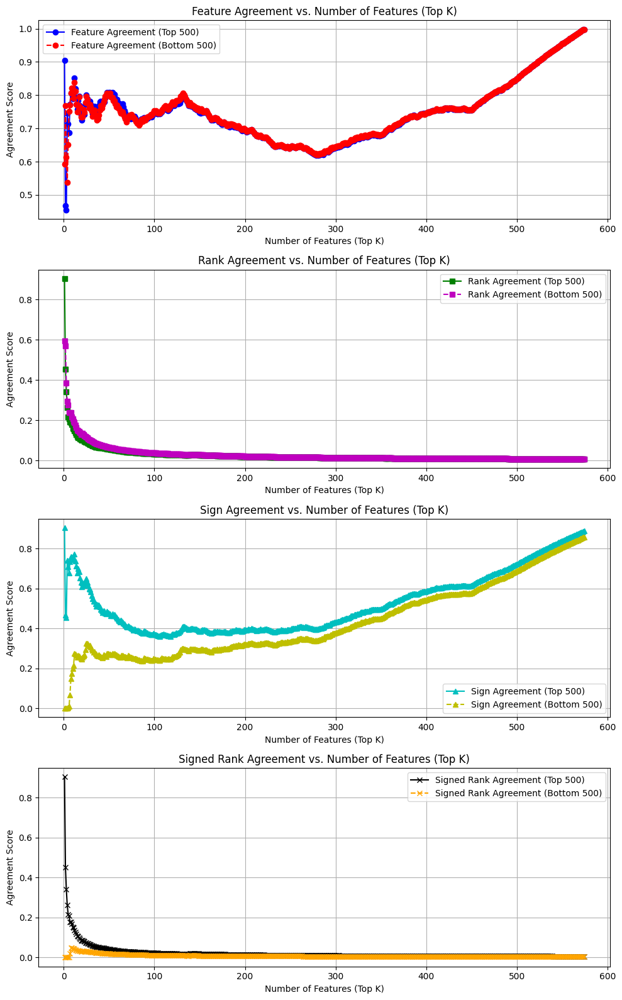

In [91]:
plot_average_accross_n_projects_various_k_features(disgreement_mean_across__top_500_various_k , disgreement_mean_across__bottom_500_various_k,575)

In [92]:
disgreement_mean_across__top_500_various_k, disgreement_mean_across__bottom_500_various_k = disgreement_mean_across_top_bottom_500(global_explanation.values, explanations["fold0"]["treeshap"], 20,"max", raw_data)

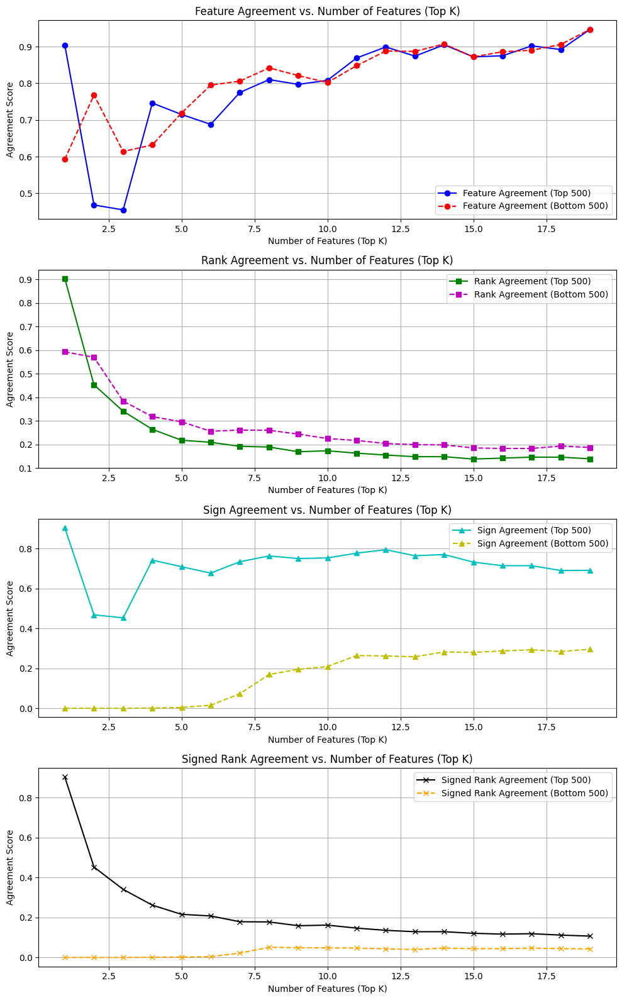

In [93]:
plot_average_accross_n_projects_various_k_features(disgreement_mean_across__top_500_various_k , disgreement_mean_across__bottom_500_various_k,20)

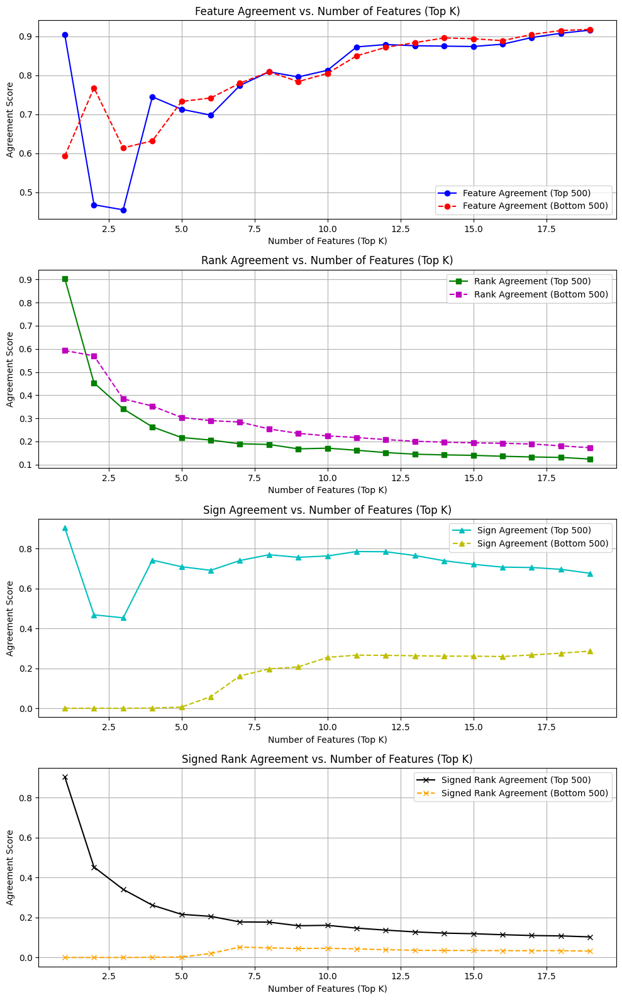

In [94]:
disgreement_mean_across__top_500_various_k_max , disgreement_mean_across__bottom_500_various_max = disgreement_mean_across_top_bottom_500(global_explanation.values, explanations["fold0"]["treeshap"], 20, "activated", raw_data)
plot_average_accross_n_projects_various_k_features(disgreement_mean_across__top_500_various_k_max , disgreement_mean_across__bottom_500_various_max,20)

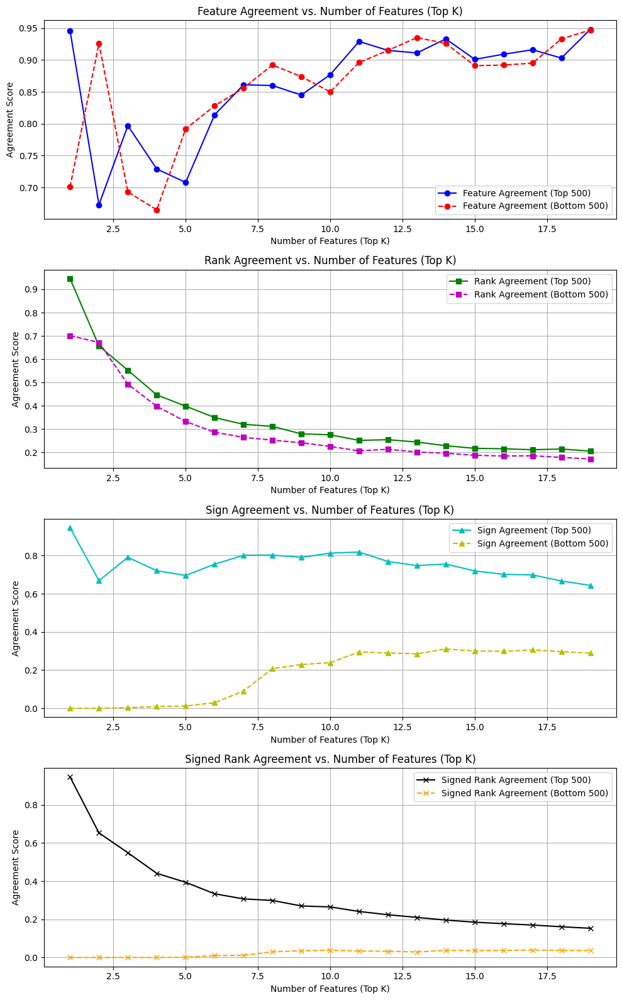

In [95]:
disgreement_mean_across__top_500_various_k_max , disgreement_mean_across__bottom_500_various_max = disgreement_mean_across_top_bottom_500(global_explanation.values, explanations["fold0"]["treeshap"], 20, "maxnonactivated", raw_data)
plot_average_accross_n_projects_various_k_features(disgreement_mean_across__top_500_various_k_max , disgreement_mean_across__bottom_500_various_max,20)

## 20% features

In [96]:
top , bottom = disgreement_mean_at_k(global_explanation.values, explanations["fold0"]["treeshap"], 115,  debug=True)


******************Project ID: cdc83b2eb031d999c123535bf09d24a0************************
Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=objec

 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['School State_Mississippi', 0

 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['School State_Mississippi', 0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['School State_Mississippi', 0.

In [97]:
print(top)

{'feature_agreement': 0.753, 'rank_agreement': 0.03, 'sign_agreement': 0.363, 'signed_rank_agreement': 0.02}


In [98]:
print(bottom)

{'feature_agreement': 0.757, 'rank_agreement': 0.034, 'sign_agreement': 0.245, 'signed_rank_agreement': 0.011}


In [99]:
top , bottom = disgreement_mean_at_k(global_explanation.values, explanations["fold0"]["treeshap"], 20,  debug=True , method="max", raw_data=raw_data)


******************Project ID: cdc83b2eb031d999c123535bf09d24a0************************
Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=objec

 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject Subcategory Tree', 0.001556

 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['School State_Mississippi', 0

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['School State_Mississippi', 0

 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['School State_Mississippi', 0

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['School State_Mississippi', 0

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['School State_Mississippi', 0

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=object), array(['School State_Illinois', 0.010733061581973777], dtype=object), array(['Schoo

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [100]:
print(top)

{'feature_agreement': 0.952, 'rank_agreement': 0.132, 'sign_agreement': 0.69, 'signed_rank_agreement': 0.102}


In [101]:
print(bottom)

{'feature_agreement': 0.95, 'rank_agreement': 0.177, 'sign_agreement': 0.302, 'signed_rank_agreement': 0.04}


In [102]:
top , bottom = disgreement_mean_at_k(global_explanation.values, explanations["fold0"]["treeshap"], 20,  debug=True , method="activated", raw_data=raw_data)


******************Project ID: cdc83b2eb031d999c123535bf09d24a0************************
Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=objec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0046754578173627045], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['School State', 0.003322619589915155], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002773147885282516], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School Metro Type', 0.0010964543706386296], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['School State', 0.003322619589915155], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.001384455858374

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0032606507910264864], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003903959116131502], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003903959116131502], ['School State', 0.0032606507910264864], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Subject Category Tree', 0.0008289367207049

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.002149936838140176], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School State', 0.0024615762729281497], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.001384455858374

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.001384455858374

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['School State', 0.002867880207179593], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0046754578173627045], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003903959116131502], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.005161673856739316], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School State', 0.0032606507910264864], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003903959116131502], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['Project Subject Subcategory Tree', 0.00155657846939950

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.001384455858374

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['School State', 0.002867880207179593], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0046754578173627045], ['Teacher Prefix', 0.0033250159937814835], ['School Metro Type', 0.002719461246649417], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306]

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0010561246001181191], ['Project

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0009993701033509856], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['School State', 0.0024615762729281497], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0046754578173627045], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Subject Category Tree', 0.00137420191515212

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0010561246001181191], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Subject Category Tree', 0.001271644983407

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003903959116131502], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.00267333382971531], ['School State', 0.0024385152849648473], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002773147885282516], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0046754578173627045], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['School State', 0.003322619589915155], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Subject Category Tree', 0.001374201915152123], ['Proje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.001384455858374130

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0046754578173627045], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.0033250159937814835], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0010561246001181191], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.002149936838140176], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School State', 0.0046754578173627045], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['Project Subje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0046754578173627045], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0032606507910264864], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0006363725742744588], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0032606507910264864], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0032606507910264864], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School State', 0.004866572389334678], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['Project Subject Subcategory Tree', 0.0015565784693995

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.002149936838140176], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.008711675880838508], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.008711675880838508], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002773147885282516], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['School State', 0.0024615762729281497], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['Project Subject Subcategory Tree', 0.0015565784693995

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.008711675880838508], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Resource Category', 0.001219387602796179], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0046754578173627045], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.005161673856739316], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007129990468953586], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0032606507910264864], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Subject Subcategory Tree', 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0046754578173627045], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School State', 0.0046754578173627045], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0032606507910264864], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0046754578173627045], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837413

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0018846205925937868], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Resource Category', 0.0012193876027

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School State', 0.0046754578173627045], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0046754578173627045], ['School Metro Type', 0.003903959116131502], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.002149936838140176], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002773147885282516], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.001384455858374

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.004866572389334678], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0018846205925937868], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Sub

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.008711675880838508], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002719461246649417], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0032606507910264864], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.001384455858374

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Sub

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School State', 0.008711675880838508], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0032606507910264864], ['School Metro Type', 0.002719461246649417], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0018846205925937868], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007129990468953586], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.002149936838140176], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0046754578173627045], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010113791866294311], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School State', 0.0032606507910264864], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Subject Category Tree', 0.00127164498340712

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.002149936838140176], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837413

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Grade Level Category', 0.002190353358749716], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.002149936838140176], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0032606507910264864], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Grade Level Category', 0.002190353358749716], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0018846205925937868], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School State', 0.0024615762729281497], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0032606507910264864], ['School Metro Type', 0.002719461246649417], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003903959116131502], ['School State', 0.0032606507910264864], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.002149936838140176], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School State', 0.002867880207179593], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0032606507910264864], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.001384455858374

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['Project Subject Subcategory Tree', 0.001556578469399504

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School State', 0.0046754578173627045], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['School County Success Rate Imputed', 0.0013844558583741306], ['Pr

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['School State', 0.0024615762729281497], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.008711675880838508], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002773147885282516], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['Project Subje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School Metro Type', 0.001096454370638

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.001033048331931031], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Subject Subcategory Tree', 0.001086268784

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.0032606507910264864], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School State', 0.0046754578173627045], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0018846205925937868], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Subject Category Tree', 0.001271644983407

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Subject Category Tree', 0.0021397892482132932], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School Count

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School State', 0.0024615762729281497], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002773147885282516], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['School State', 0.0032606507910264864], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School State', 0.004843467967315698], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['School County Success Rate Imputed', 0.0013844558583741306], ['Pro

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.005161673856739316], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0010561246001181191], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School State', 0.0046754578173627045], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.001384455858374

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Subject Category Tree', 0.0012716449834071

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0006363725742744588], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.0033250159937814835], ['School Metro Type', 0.002719461246649417], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Subject Category Tree', 0.0012716449834071

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Grade Level Category', 0.002190353358749716], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002773147885282516], ['School State', 0.0024615762729281497], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School State', 0.0032606507910264864], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.005161673856739316], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Grade Level Category', 0.002190353358749716], ['Teacher Prefix', 0.0019613590245752687], ['Project Type', 0.0018846205925937868], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.002149936838140176], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.002867880207179593], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002773147885282516], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Subject Category Tree', 0.00081815259070

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School State', 0.0046754578173627045], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.0033250159937814835], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School Metro Type', 0.0010964543706

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School State', 0.0024615762729281497], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007301743462981338], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.00138445585837413

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Subject Category Tree', 0.001067993906375

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['Project Subject Subcategory Tree', 0.001556578469399504

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.007129990468953586], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003903959116131502], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.002149936838140176], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010113791866294311], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['Project Subject Subcategory Tree', 0.00155657846939950

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School State', 0.007129990468953586], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project Su

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.001384455858374

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School State', 0.009265902553855522], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.002773147885282516], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.002190353358749716], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School State', 0.007589353681986768], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003943482754726902], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Grade Level Category', 0.0018638039483081996], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002773147885282516], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0022514177885813013], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['School State', 0.0021378880374414116], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['Project 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School State', 0.004866572389334678], ['Project Grade Level Category', 0.0029688577721777134], ['School Metro Type', 0.002719461246649417], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019289178869664931], ['Project Type', 0.0016263807739691878], ['Project Subject Subcategory Tree', 0.0015565784693995046

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['Project Resource Category', 0.009779358649259948], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['Teacher Prefix', 0.00267333382971531], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Type', 0.0016263807739691878], ['School County Success Rate Imputed', 0.0013844558583741306], ['School State', 0.0012182745328238953], ['Project 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [103]:
print(top)

{'feature_agreement': 0.95, 'rank_agreement': 0.136, 'sign_agreement': 0.71, 'signed_rank_agreement': 0.116}


In [104]:
print(bottom)

{'feature_agreement': 0.95, 'rank_agreement': 0.18, 'sign_agreement': 0.329, 'signed_rank_agreement': 0.047}


In [105]:
top , bottom = disgreement_mean_at_k(global_explanation.values, explanations["fold0"]["treeshap"], 20,  debug=True , method="maxnonactivated", raw_data=raw_data)


******************Project ID: cdc83b2eb031d999c123535bf09d24a0************************
Initial Explanation 1 
 [array(['Project Cost', 0.2599720532503212], dtype=object), array(['School Success Rate', 0.09443547578970575], dtype=object), array(['School City Success Rate', 0.06234345759559309], dtype=object), array(['Project Resource Category_Technology', 0.05590279872535298],
      dtype=object), array(['School County Success Rate', 0.05056368552397339], dtype=object), array(['Teacher Success Rate', 0.04092739985879964], dtype=object), array(['Teacher Project Posted Sequence', 0.03659256423140834],
      dtype=object), array(['Project Posted Month', 0.036100048426852806], dtype=object), array(['Project Resource Category_Books', 0.0270314331657448],
      dtype=object), array(['Project Count in State', 0.025140087167820183], dtype=object), array(['School Percentage Free Lunch', 0.02389329825595476], dtype=object), array(['Teacher Success Rate Imputed', 0.014344914786287518], dtype=objec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0018846205925937868], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0018846205925937868], ['Project Subje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0018846205925937868], ['Project Subje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Type', 0.0018846205925937868], ['Project Subje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County S

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Type', 0.0018846205925937868], ['Project Subje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Resource Category', 0.0270314331657448], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subject

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010496705563170072], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0019586068659635967], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Teacher Prefix', 0.0033250159937814835], ['Project Grade Level Category', 0.0029688577721777134], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subje

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003903959116131502], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['School County 

After Compact Explanation 1 
 [['Project Cost', 0.2599720532503212], ['School Success Rate', 0.09443547578970575], ['School City Success Rate', 0.06234345759559309], ['Project Resource Category', 0.05590279872535298], ['School County Success Rate', 0.05056368552397339], ['Teacher Success Rate', 0.04092739985879964], ['Teacher Project Posted Sequence', 0.03659256423140834], ['Project Posted Month', 0.036100048426852806], ['Project Count in State', 0.025140087167820183], ['School Percentage Free Lunch', 0.02389329825595476], ['Teacher Success Rate Imputed', 0.014344914786287518], ['School State', 0.010733061581973777], ['School Success Rate Imputed', 0.006876595344258723], ['Teacher Prefix', 0.005092031353488309], ['Project Type', 0.0047677704807176135], ['School Metro Type', 0.003943482754726902], ['Project Grade Level Category', 0.0024169498930726044], ['School City Success Rate Imputed', 0.0022854201305964046], ['Project Subject Category Tree', 0.0021397892482132932], ['Project Subjec

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [106]:
print(top)

{'feature_agreement': 0.952, 'rank_agreement': 0.198, 'sign_agreement': 0.633, 'signed_rank_agreement': 0.147}


In [107]:
print(bottom)

{'feature_agreement': 0.95, 'rank_agreement': 0.173, 'sign_agreement': 0.288, 'signed_rank_agreement': 0.044}
